In [3]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd 
import seaborn as sns 
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import boxcox, shapiro, skew
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report


Read Dataset

In [4]:
df = pd.read_csv(r"C:\guvi_class\Project\cancer.csv")
df.head()


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [6]:
df.shape


(569, 33)

In [8]:
df.dtypes


id                           int64
diagnosis                   object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst     

Identifying Missing values

In [9]:
missing_values = df.isnull().sum()
print("Total Missing vlues:")
print(missing_values)


Total Missing vlues:
id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_

In [10]:
unique_values = df['Unnamed: 32'].unique()
print(unique_values)


[nan]


Drop irrelevant columns

In [11]:
df.drop(columns=['id','Unnamed: 32'], inplace=True)
df.head()


,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [12]:
df.shape


(569, 31)

In [13]:
df.describe().T


,count,mean,std,min,25%,50%,75%,max
radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
concave points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400
fractal_dimension_mean,569.0,0.062798,0.007060,0.049960,0.057700,0.061540,0.066120,0.09744


In [15]:
df.value_counts()


diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  smoothness_mean  compactness_mean  concavity_mean  concave points_mean  symmetry_mean  fractal_dimension_mean  radius_se  texture_se  perimeter_se  area_se  smoothness_se  compactness_se  concavity_se  concave points_se  symmetry_se  fractal_dimension_se  radius_worst  texture_worst  perimeter_worst  area_worst  smoothness_worst  compactness_worst  concavity_worst  concave points_worst  symmetry_worst  fractal_dimension_worst
B          6.981        13.43         43.79           143.5      0.11700          0.07568           0.00000         0.00000              0.1930         0.07818                 0.2241     1.5080      1.5530        9.833    0.010190       0.01084         0.00000       0.000000           0.02659      0.004100              7.93          19.54          50.41            185.2       0.1584            0.1202             0.0000           0.00000               0.2932          0.09382                    1
M    

Visualize diagnosis distribution

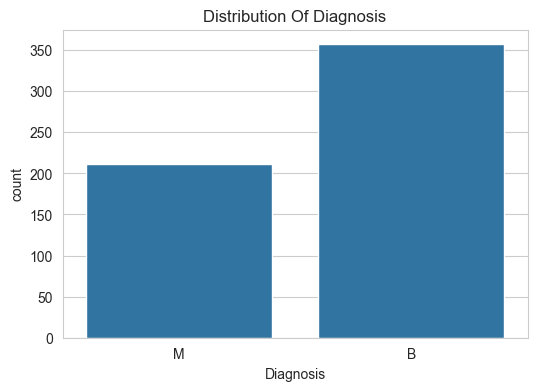

In [16]:
sns.set_style("whitegrid")
plt.figure(figsize=(6,4))
sns.countplot(x='diagnosis',data=df)
plt.title("Distribution Of Diagnosis")
plt.xlabel("Diagnosis")
plt.ylabel("count")
plt.show()


visualize numerical features

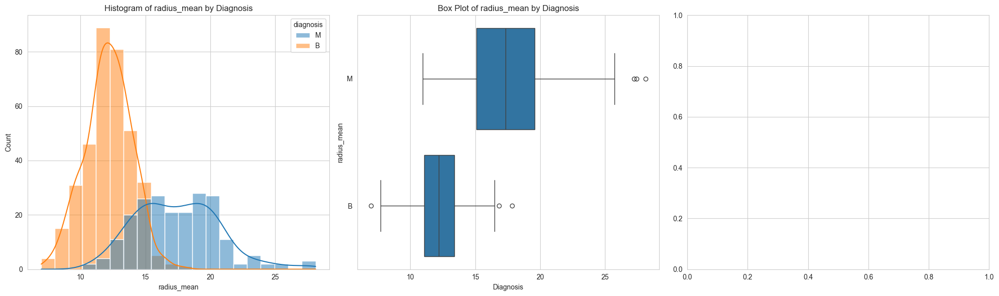

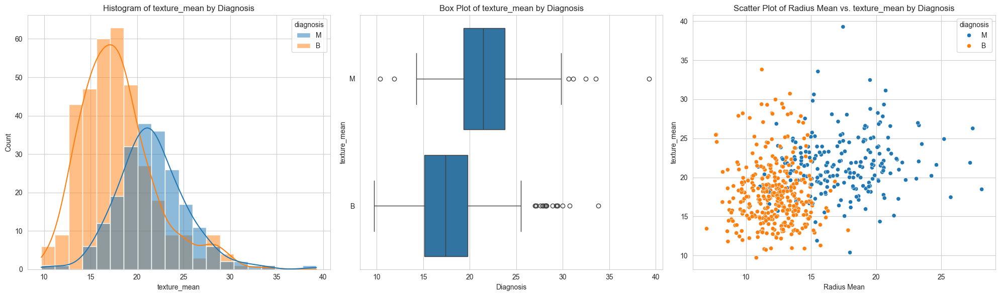

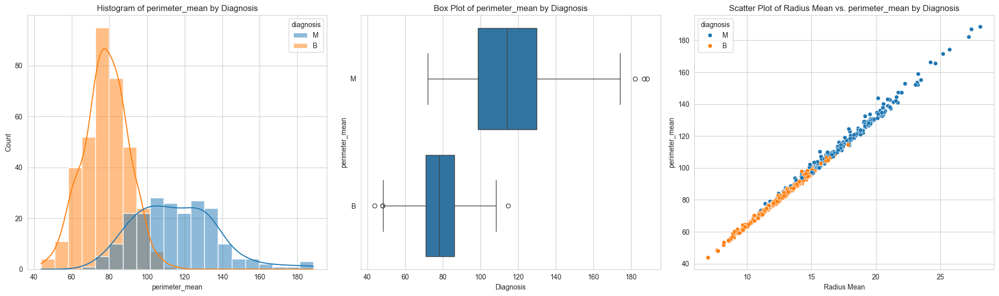

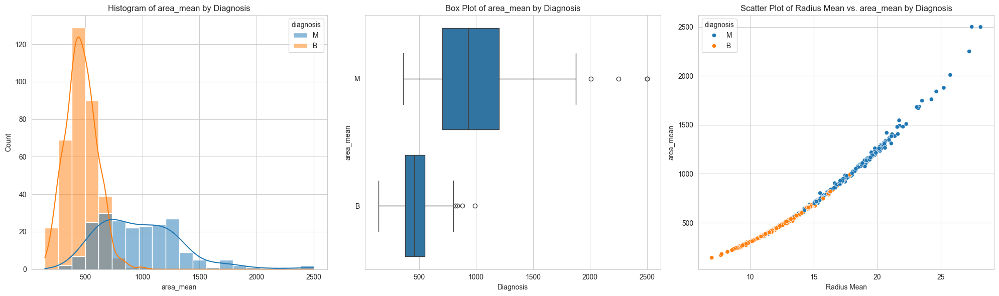

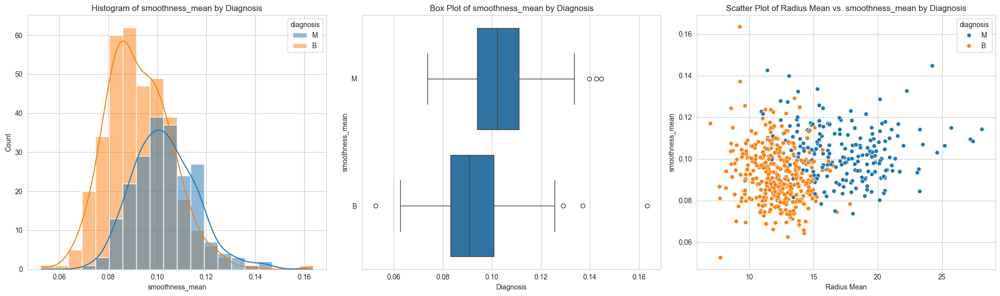

...

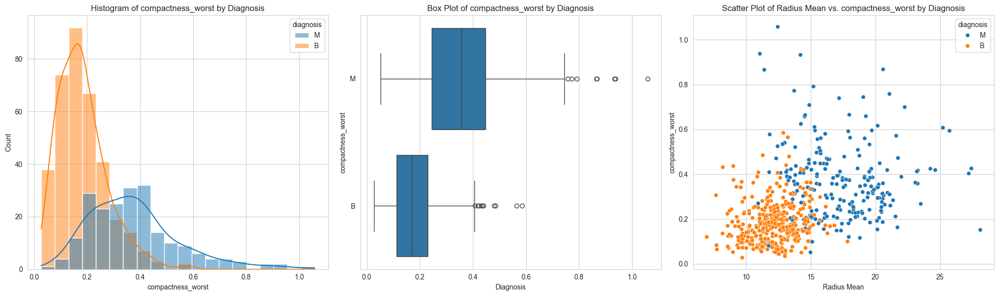

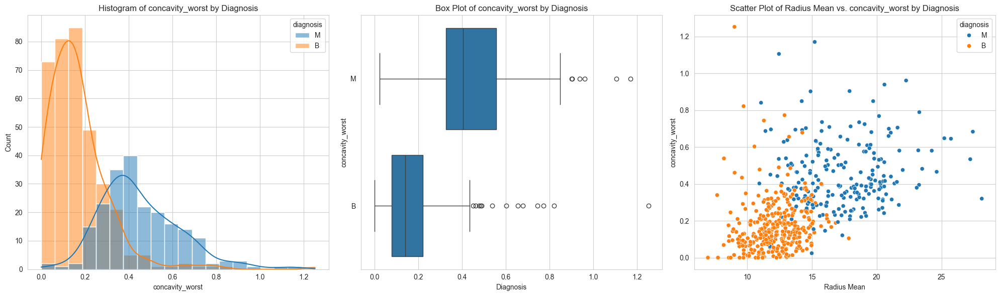

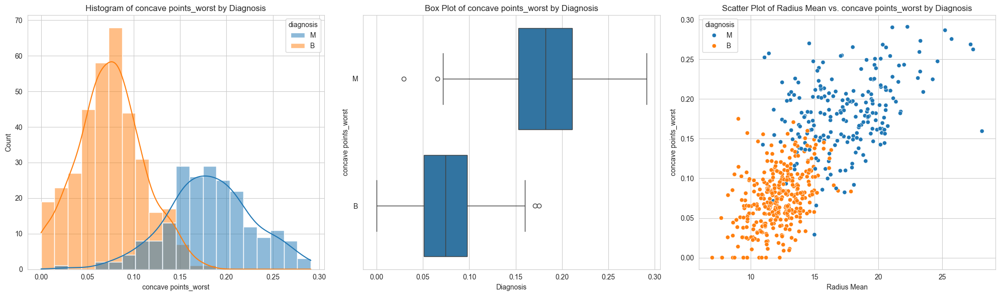

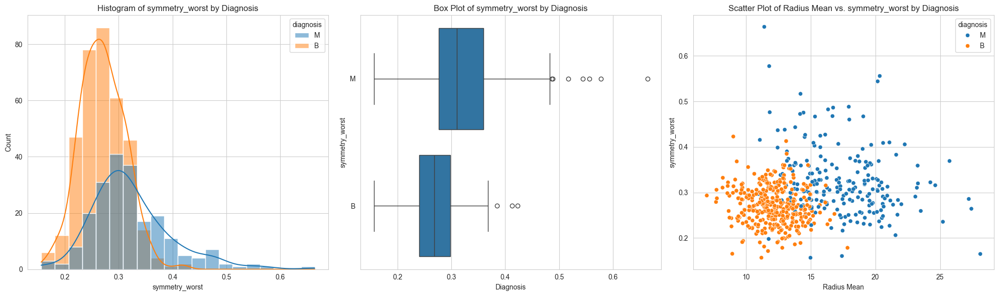

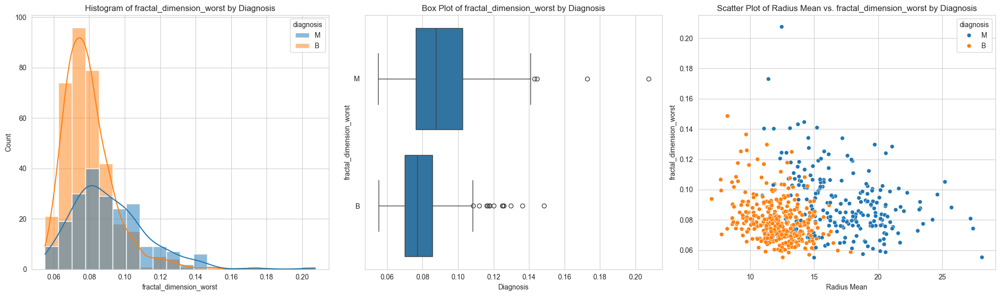

In [17]:
numerical_features = df.select_dtypes(include=["float64"])

for feature in numerical_features.columns:
    if feature != 'diagnosis':

        # subplots with 1 row and 3 columns
        fig, axes = plt.subplots(1, 3, figsize=(20, 6))

        # Histogram
        sns.histplot(data=df, x=feature, hue='diagnosis', kde=True, bins=20, ax=axes[0])
        axes[0].set_title(f"Histogram of {feature} by Diagnosis")
        axes[0].set_xlabel(feature)
        axes[0].set_ylabel("Count")

        # Box plot
        sns.boxplot(x=feature, y='diagnosis', data=df, ax=axes[1])
        axes[1].set_title(f"Box Plot of {feature} by Diagnosis")
        axes[1].set_xlabel("Diagnosis")
        axes[1].set_ylabel(feature)

        # Scatter plot
        if feature != "radius_mean":
            sns.scatterplot(x='radius_mean', y=feature, hue='diagnosis', data=df, ax=axes[2])
            axes[2].set_title(f"Scatter Plot of Radius Mean vs. {feature} by Diagnosis")
            axes[2].set_xlabel("Radius Mean")
            axes[2].set_ylabel(feature)

        plt.tight_layout()
        plt.show()


Calculate skewness coefficient for each numerical feature

In [18]:
for feature in numerical_features.columns:
    skewness = skew(df[feature])
    print(f"Skewness coefficient for {feature}: {skewness}")


Skewness coefficient for radius_mean: 0.9398934455576345
Skewness coefficient for texture_mean: 0.6487335672867015
Skewness coefficient for perimeter_mean: 0.9880369541677213
Skewness coefficient for area_mean: 1.6413905092044112
Skewness coefficient for smoothness_mean: 0.4551199203571718
Skewness coefficient for compactness_mean: 1.186983323974523
Skewness coefficient for concavity_mean: 1.3974832352826647
Skewness coefficient for concave points_mean: 1.1680903481012583
Skewness coefficient for symmetry_mean: 0.7236947177154984
Skewness coefficient for fractal_dimension_mean: 1.3010473927890858
Skewness coefficient for radius_se: 3.080463985335206
Skewness coefficient for texture_se: 1.6421002649479612
Skewness coefficient for perimeter_se: 3.4345304746147067
Skewness coefficient for area_se: 5.432815862951913
Skewness coefficient for smoothness_se: 2.308344221045982
Skewness coefficient for compactness_se: 1.8972023914083855
Skewness coefficient for concavity_se: 5.096980949017036
S

Correct skewness using Box-Cox transformation

In [19]:
for feature in numerical_features.columns:
    transformed_feature, _ = boxcox(df[feature] + 1)  # Adding 1 to handle non-positive values
    df[f"{feature}_BoxCox"] = transformed_feature


Check normality after transformation

In [20]:
for feature in numerical_features.columns:
    if feature != 'diagnosis':
        statistic_orig, p_value_orig = shapiro(df[feature])
        statistic_trans, p_value_trans = shapiro(df[f"{feature}_BoxCox"])
        print(f"Original Data - Shapiro-Wilk test for {feature}: Statistic: {statistic_orig}, p-value: {p_value_orig}")
        print(f"Transformed Data - Shapiro-Wilk test for {feature}_BoxCox: Statistic: {statistic_trans}, p-value: {p_value_trans}")


Original Data - Shapiro-Wilk test for radius_mean: Statistic: 0.9410690724099641, p-value: 3.105643573333165e-14
Transformed Data - Shapiro-Wilk test for radius_mean_BoxCox: Statistic: 0.9930998373056152, p-value: 0.010227093127484571
Original Data - Shapiro-Wilk test for texture_mean: Statistic: 0.9767206237297718, p-value: 7.283580702733753e-08
Transformed Data - Shapiro-Wilk test for texture_mean_BoxCox: Statistic: 0.9988663709199757, p-value: 0.979760922653704
Original Data - Shapiro-Wilk test for perimeter_mean: Statistic: 0.9361825205701582, p-value: 7.011401652060644e-15
Transformed Data - Shapiro-Wilk test for perimeter_mean_BoxCox: Statistic: 0.993109471989359, p-value: 0.01031927264712607
Original Data - Shapiro-Wilk test for area_mean: Statistic: 0.858401338203027, p-value: 3.1962641979601284e-22
Transformed Data - Shapiro-Wilk test for area_mean_BoxCox: Statistic: 0.9930010975614583, p-value: 0.009329795409928758
Original Data - Shapiro-Wilk test for smoothness_mean: Statis

Calculate IQR for each numerical feature

In [21]:
Q1 = df[numerical_features.columns].quantile(0.25)
Q3 = df[numerical_features.columns].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers = ((df[numerical_features.columns] < lower_bound) | (df[numerical_features.columns] > upper_bound)).any(axis=1)

outlier_count = outliers.sum()
outlier_percentage = (outlier_count / len(df)) * 100

print(f"Total number of outliers: {outlier_count}")
print(f"Percentage of outliers: {outlier_percentage:.2f}%")


Total number of outliers: 171
Percentage of outliers: 30.05%


Remove outliers

In [22]:
df_no_outliers = df[~outliers]
print("Shape of DataFrame before removing outliers:", df.shape)
print("Shape of DataFrame after removing outliers:", df_no_outliers.shape)


Shape of DataFrame before removing outliers: (569, 61)
Shape of DataFrame after removing outliers: (398, 61)


In [23]:
df_no_outliers.head()


,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst_BoxCox,texture_worst_BoxCox,perimeter_worst_BoxCox,area_worst_BoxCox,smoothness_worst_BoxCox,compactness_worst_BoxCox,concavity_worst_BoxCox,concave points_worst_BoxCox,symmetry_worst_BoxCox,fractal_dimension_worst_BoxCox
6,M,18.25,19.98,119.6,1040.0,0.09463,0.10900,0.11270,0.07400,0.1794,...,1.150930,4.498621,1.456551,2.744014,0.095709,0.160719,0.237213,0.134962,0.138018,0.032810
7,M,13.71,20.83,90.2,577.9,0.11890,0.16450,0.09366,0.05985,0.2196,...,1.126227,4.527747,1.443723,2.689175,0.104154,0.195210,0.189149,0.115795,0.140199,0.035085
10,M,16.02,23.24,102.7,797.8,0.08206,0.06669,0.03299,0.03323,0.1528,...,1.136753,4.848261,1.448472,2.713871,0.083837,0.114696,0.119303,0.081990,0.136009,0.032897
11,M,15.78,17.89,103.6,781.0,0.09710,0.12920,0.09954,0.06606,0.1842,...,1.141967,4.475274,1.452314,2.725256,0.093742,0.233115,0.244015,0.129023,0.148382,0.034528
13,M,15.85,23.95,103.7,782.7,0.08401,0.10020,0.09938,0.05364,0.1847,...,1.125012,4.498621,1.444270,2.686772,0.081354,0.133429,0.170870,0.089957,0.133417,0.029899


In [24]:
columns_to_keep = [col for col in df.columns if 'BoxCox' in col or col == 'diagnosis']

# Keep only the desired columns
df_filtered = df_no_outliers[columns_to_keep]

# Display the resulting DataFrame
df_filtered


,diagnosis,radius_mean_BoxCox,texture_mean_BoxCox,perimeter_mean_BoxCox,area_mean_BoxCox,smoothness_mean_BoxCox,compactness_mean_BoxCox,concavity_mean_BoxCox,concave points_mean_BoxCox,symmetry_mean_BoxCox,...,radius_worst_BoxCox,texture_worst_BoxCox,perimeter_worst_BoxCox,area_worst_BoxCox,smoothness_worst_BoxCox,compactness_worst_BoxCox,concavity_worst_BoxCox,concave points_worst_BoxCox,symmetry_worst_BoxCox,fractal_dimension_worst_BoxCox
6,M,1.429079,2.905681,1.873942,3.622483,0.061543,0.068323,0.071878,0.044795,0.093204,...,1.150930,4.498621,1.456551,2.744014,0.095709,0.160719,0.237213,0.134962,0.138018,0.032810
7,M,1.375234,2.941831,1.844002,3.480532,0.070244,0.084571,0.063984,0.039518,0.101444,...,1.126227,4.527747,1.443723,2.689175,0.104154,0.195210,0.189149,0.115795,0.140199,0.035085
10,M,1.405454,3.036937,1.858264,3.560615,0.056209,0.049448,0.028596,0.026130,0.086242,...,1.136753,4.848261,1.448472,2.713871,0.083837,0.114696,0.119303,0.081990,0.136009,0.032897
11,M,1.402621,2.809952,1.859193,3.555497,0.062520,0.075141,0.066554,0.041966,0.094320,...,1.141967,4.475274,1.452314,2.725256,0.093742,0.233115,0.244015,0.129023,0.148382,0.034528
13,M,1.403454,3.063103,1.859295,3.556021,0.057078,0.064957,0.066486,0.036842,0.094434,...,1.125012,4.498621,1.444270,2.686772,0.081354,0.133429,0.170870,0.089957,0.133417,0.029899
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
554,B,1.362483,3.227213,1.833685,3.450205,0.055835,0.044742,0.047748,0.019725,0.087324,...,1.105630,4.942677,1.433443,2.643779,0.086059,0.118358,0.177050,0.056986,0.123926,0.031432
555,B,1.313564,3.186851,1.805291,3.320076,0.059776,0.054518,0.046596,0.022419,0.088074,...,1.076656,4.901049,1.420123,2.577849,0.093220,0.122996,0.152921,0.076208,0.120230,0.032719
558,B,1.387574,3.015736,1.851403,3.513085,0.057395,0.076297,0.067968,0.028564,0.084044,...,1.116853,4.474656,1.441799,2.667627,0.075902,0.180817,0.232476,0.089058,0.121065,0.032408
560,B,1.380136,3.172225,1.845469,3.490305,0.063367,0.069627,0.036863,0.031678,0.086501,...,1.115682,4.811112,1.439269,2.663481,0.086724,0.148438,0.110295,0.085346,0.120858,0.032760


In [25]:
features = df_filtered.select_dtypes(include=["float64"])


After Handling skewness and Removing outliers

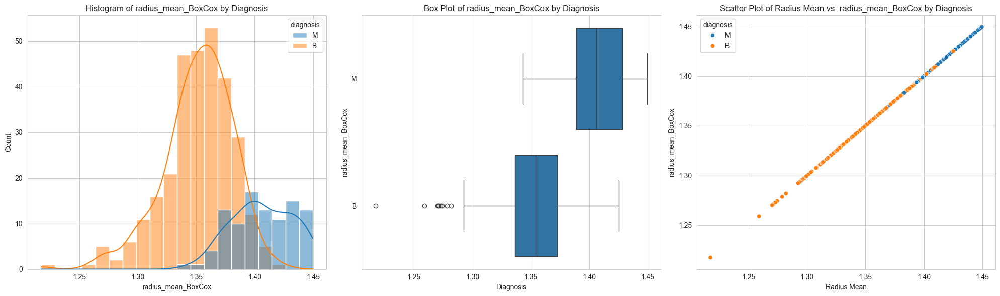

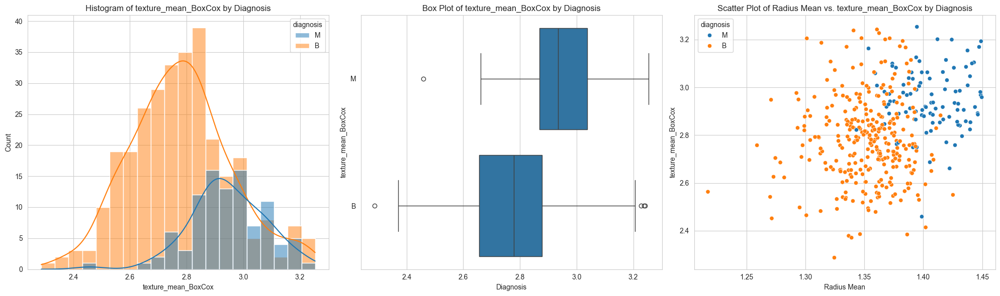

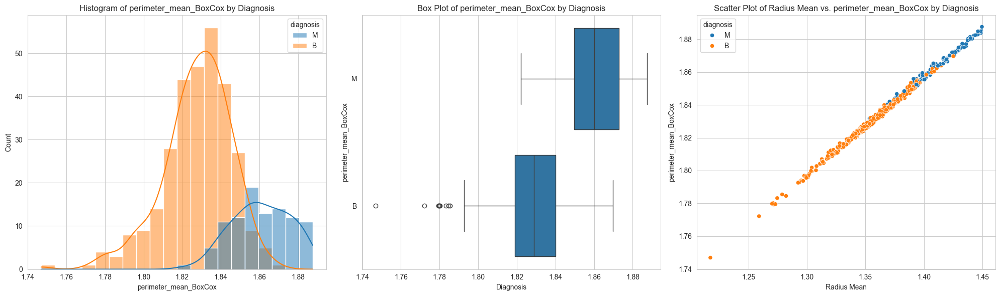

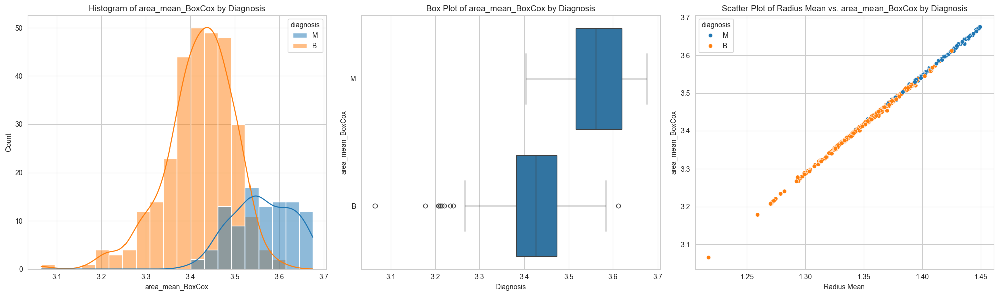

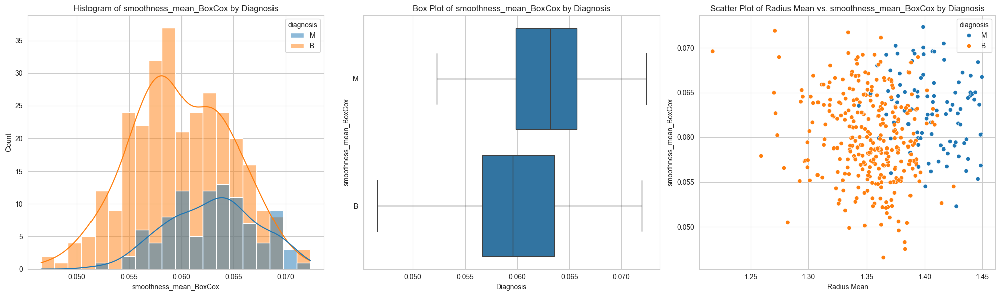

...

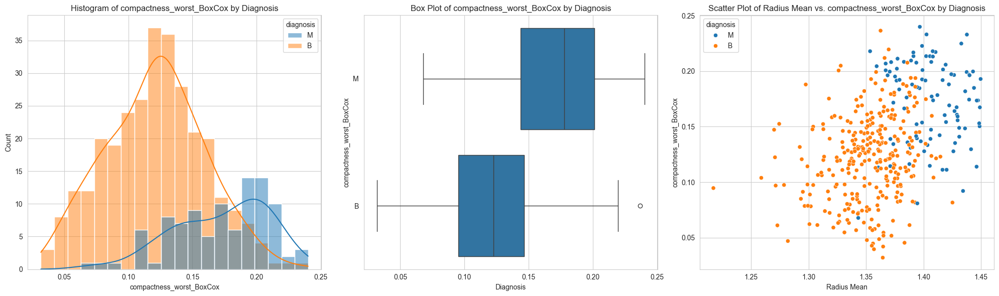

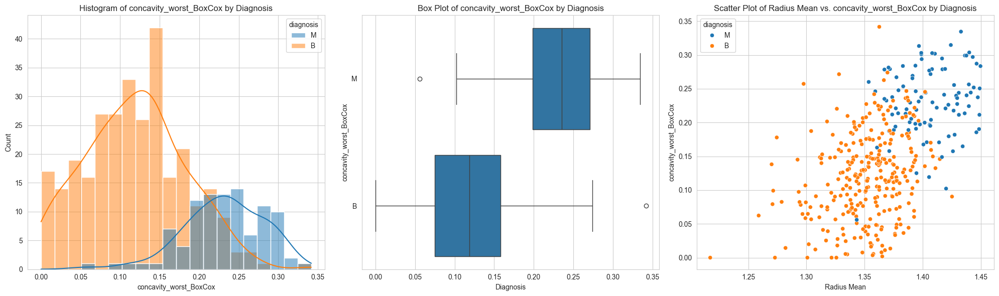

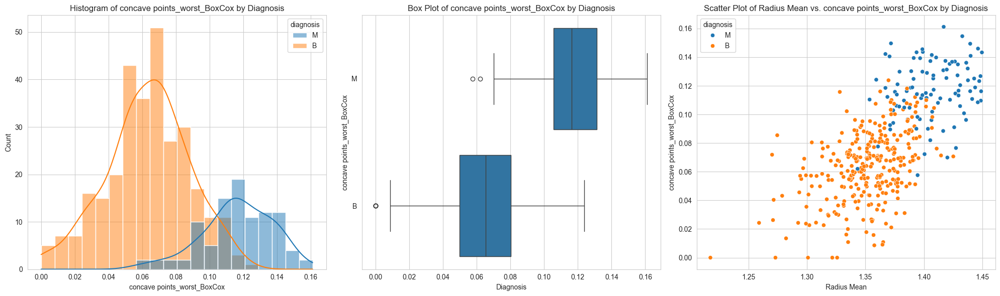

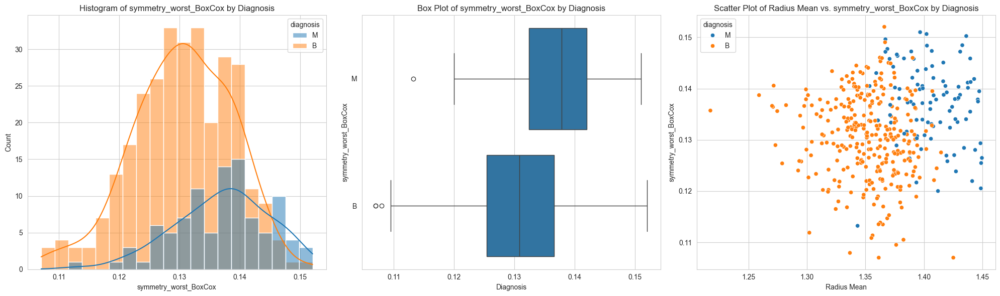

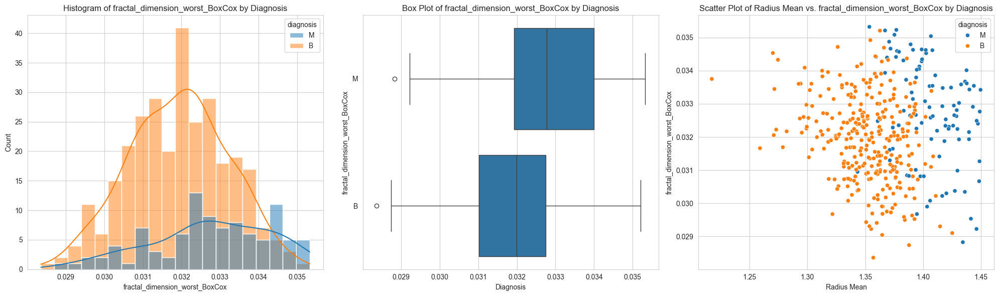

In [26]:
for feature in features.columns:
    if feature != 'diagnosis':

        # subplots with 1 row and 3 columns
        fig, axes = plt.subplots(1, 3, figsize=(20, 6))

        # Histogram
        sns.histplot(data=df_filtered, x=feature, hue='diagnosis', kde=True, bins=20, ax=axes[0])
        axes[0].set_title(f"Histogram of {feature} by Diagnosis")
        axes[0].set_xlabel(feature)
        axes[0].set_ylabel("Count")

        # Box plot
        sns.boxplot(x=feature, y='diagnosis', data=df_filtered, ax=axes[1])
        axes[1].set_title(f"Box Plot of {feature} by Diagnosis")
        axes[1].set_xlabel("Diagnosis")
        axes[1].set_ylabel(feature)

        # Scatter plot
        if feature != "radius_mean":
            sns.scatterplot(x='radius_mean_BoxCox', y=feature, hue='diagnosis', data=df_filtered, ax=axes[2])
            axes[2].set_title(f"Scatter Plot of Radius Mean vs. {feature} by Diagnosis")
            axes[2].set_xlabel("Radius Mean")
            axes[2].set_ylabel(feature)

        plt.tight_layout()
        plt.show()


In [27]:
df_filtered.describe().T


,count,mean,std,min,25%,50%,75%,max
radius_mean_BoxCox,398.0,1.365318,0.037135,1.217268,1.342328,1.364321,1.388242,1.449647
texture_mean_BoxCox,398.0,2.820682,0.181678,2.286914,2.697284,2.823632,2.938700,3.253609
perimeter_mean_BoxCox,398.0,1.835998,0.022146,1.746959,1.822292,1.835893,1.849488,1.887550
area_mean_BoxCox,398.0,3.455696,0.096155,3.064834,3.395942,3.452241,3.515769,3.675222
smoothness_mean_BoxCox,398.0,0.060724,0.004883,0.046557,0.057303,0.060635,0.064299,0.072356
compactness_mean_BoxCox,398.0,0.056760,0.014897,0.017683,0.045520,0.055909,0.068314,0.092012
concavity_mean_BoxCox,398.0,0.041698,0.024739,0.000000,0.022914,0.037509,0.059275,0.104815
concave points_mean_BoxCox,398.0,0.025212,0.013169,0.000000,0.016237,0.023021,0.034908,0.057210
symmetry_mean_BoxCox,398.0,0.091414,0.005181,0.074233,0.087991,0.091467,0.095287,0.105679
fractal_dimension_mean_BoxCox,398.0,0.017446,0.000176,0.016919,0.017315,0.017456,0.017568,0.017870


Correlation Analysis

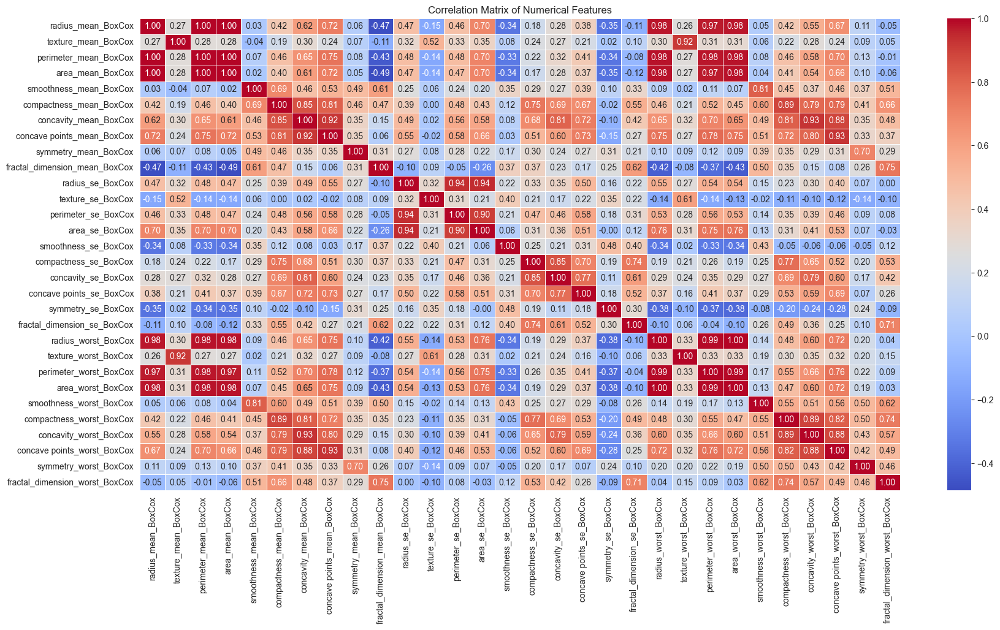

In [28]:
corr_matrix = df_filtered[features.columns].corr()
#print(corr_matrix)
plt.figure(figsize=(20,10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix of Numerical Features')
plt.show()


In [29]:
data = df_filtered
data.head()


,diagnosis,radius_mean_BoxCox,texture_mean_BoxCox,perimeter_mean_BoxCox,area_mean_BoxCox,smoothness_mean_BoxCox,compactness_mean_BoxCox,concavity_mean_BoxCox,concave points_mean_BoxCox,symmetry_mean_BoxCox,...,radius_worst_BoxCox,texture_worst_BoxCox,perimeter_worst_BoxCox,area_worst_BoxCox,smoothness_worst_BoxCox,compactness_worst_BoxCox,concavity_worst_BoxCox,concave points_worst_BoxCox,symmetry_worst_BoxCox,fractal_dimension_worst_BoxCox
6,M,1.429079,2.905681,1.873942,3.622483,0.061543,0.068323,0.071878,0.044795,0.093204,...,1.150930,4.498621,1.456551,2.744014,0.095709,0.160719,0.237213,0.134962,0.138018,0.032810
7,M,1.375234,2.941831,1.844002,3.480532,0.070244,0.084571,0.063984,0.039518,0.101444,...,1.126227,4.527747,1.443723,2.689175,0.104154,0.195210,0.189149,0.115795,0.140199,0.035085
10,M,1.405454,3.036937,1.858264,3.560615,0.056209,0.049448,0.028596,0.026130,0.086242,...,1.136753,4.848261,1.448472,2.713871,0.083837,0.114696,0.119303,0.081990,0.136009,0.032897
11,M,1.402621,2.809952,1.859193,3.555497,0.062520,0.075141,0.066554,0.041966,0.094320,...,1.141967,4.475274,1.452314,2.725256,0.093742,0.233115,0.244015,0.129023,0.148382,0.034528
13,M,1.403454,3.063103,1.859295,3.556021,0.057078,0.064957,0.066486,0.036842,0.094434,...,1.125012,4.498621,1.444270,2.686772,0.081354,0.133429,0.170870,0.089957,0.133417,0.029899


In [41]:
data.to_csv('new_data.csv', index=False)


Feature Selection

In [31]:
X = df_no_outliers.drop(columns=['diagnosis'])
y = df_no_outliers['diagnosis']
selector = SelectKBest(score_func=f_classif, k=10)
X_new = selector.fit_transform(X, y)
selected_indices = selector.get_support(indices=True)
selected_features = X.columns[selected_indices]
print(selected_features)


Index(['concavity_mean', 'concave points_mean', 'area_se', 'radius_worst',
       'perimeter_worst', 'area_worst', 'concave points_worst',
       'concave points_mean_BoxCox', 'perimeter_worst_BoxCox',
       'area_worst_BoxCox'],
      dtype='object')


Train-test split

In [32]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)


In [45]:
X_test.columns


Index(['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'radius_mean_BoxCox',
       'texture_mean_BoxCox', 'perimeter_mean_BoxCox', 'area_mean_BoxCox',
       'smoothness_mean_BoxCox', 'compactness_mean_BoxCox',
       'concavity_mean_BoxCox', 'concave points_mean_BoxCox',
       'symmetry_mean_BoxCox', 'fractal_dimension_mean_BoxCox',
       'radius_se_BoxCox', 'texture_se_BoxCox', 'perimeter_se_BoxCox',
       'area_se_BoxCox', 'smoothness_s

In [33]:
# Define the SVM pipeline
svm_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svm', SVC(probability=True)) 
])


Hyperparameter tuning using randomized search

In [34]:
param_grid = {'svm__kernel': ['linear', 'poly', 'rbf'],
            'svm__C': [0.001, 0.01, 0.1, 1, 10, 100],
            'svm__gamma': ['scale', 'auto', 0.1, 0.5, 1, 5],
            'svm__degree': [2, 3, 4]}


In [35]:
random_search = RandomizedSearchCV(svm_pipeline, param_grid, n_iter=100, cv=5, scoring='accuracy', verbose=2, n_jobs=-1)
random_search.fit(X_train, y_train)

print("Best Parameters:", random_search.best_params_)


Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best Parameters: {'svm__kernel': 'linear', 'svm__gamma': 5, 'svm__degree': 4, 'svm__C': 0.1}


Evaluate the model

In [36]:
y_pred_test = random_search.best_estimator_.predict(X_test)
accuracy_test = accuracy_score(y_test, y_pred_test)
precision_test = precision_score(y_test, y_pred_test, pos_label='M')
recall_test = recall_score(y_test, y_pred_test, pos_label='M')
f1_test = f1_score(y_test, y_pred_test, pos_label='M')
roc_auc_test = roc_auc_score(y_test, random_search.best_estimator_.predict_proba(X_test)[:, 1])


In [37]:
print("Accuracy:", accuracy_test)
print("Precision (Malignant):", precision_test)
print("Recall (Malignant):", recall_test)
print("F1-score (Malignant):", f1_test)
print("ROC AUC Score:", roc_auc_test)


Accuracy: 0.9375
Precision (Malignant): 0.9411764705882353
Recall (Malignant): 0.8
F1-score (Malignant): 0.8648648648648649
ROC AUC Score: 0.9958333333333333


In [38]:
print(classification_report(y_test, y_pred_test))


              precision    recall  f1-score   support

           B       0.94      0.98      0.96        60
           M       0.94      0.80      0.86        20

    accuracy                           0.94        80
   macro avg       0.94      0.89      0.91        80
weighted avg       0.94      0.94      0.94        80



In [39]:
import pickle


In [40]:
with open('svm_model.pkl', 'wb') as file:
    pickle.dump(random_search.best_estimator_, file)
